In [1]:
import torch.utils.data
import random
from os import path
import numpy as np
import torch
import torchvision.transforms as transforms
import dataloaders
from matplotlib import pyplot as plt
import torchvision.utils as vutils

from networks import dcgan
from networks import wdcgan_gp
from networks import sndcgan
from networks import rdcgan
from networks import cdcgan
from networks import wcdcgan_gp
from networks import sncdcgan
from networks import rcdcgan

from networks.utils import compute_kid_score
from networks.utils import plot_grid
from sample_and_visualize import sample_and_visualize

In [2]:
USE_CUDA = True
if USE_CUDA and torch.cuda.is_available():
    device = 'cuda'  #alt: "cuda:0"
else:
    device = 'cpu'

PIN_MEMORY = True
USE_MULTI_PROCESS_DATA_LOADING = True
if USE_MULTI_PROCESS_DATA_LOADING:
    NUM_THREADS = torch.get_num_threads()
    print("Number of Threads: ", NUM_THREADS)
else:
    NUM_THREADS = 0
    print("Not using Multi-Process Data Loading.")

SEED = 0
random.seed(SEED)
torch.manual_seed(SEED);

### Data
DATA_PATH = path.join("data", "tmdb-64")
TABLE_PATH = path.join("data", "tmdb-movies-220915-clean.pkl")

Number of Threads:  8


In [3]:
### Architecture
IMAGE_SIZE = 64
IMAGE_SIZE_RATIO = 3
NUM_IMG_CHANNELS = 3
NUM_NOISE_VEC_CHANNELS = 100
NUM_FEATURE_VEC_CHANNELS = 37
BASE_NUM_OUT_CHANNELS_G_non_conditional = 64
BASE_NUM_OUT_CHANNELS_G_conditional = 128
BASE_NUM_OUT_CHANNELS_D = 64
D_NORM_LAYER_TYPE = "instance"
PADDING_MODE = "reflect"
COLORMODE="RGB"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Poster subset:
GENRE = None
GENRE_LOGIC = 'and'
OG_LANG = None
YEAR = None
RUNTIME = (40, np.inf)
MAX_NUM = None
SORT = None

BATCH_SIZE = 100
mode = "generated"
iterations = 5
seed = 79469812346923649

genres = ["is_thriller", "is_western", "is_music"]
languages = ["lang_en", "lang_ar", "lang_ja", "lang_zh", "lang_ru"]

In [4]:
poster_dataset = dataloaders.PosterDataset(table_path=TABLE_PATH, img_root_path=DATA_PATH,
                                           img_transform=transforms.Compose([
                                               transforms.ToTensor(),
                                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
                                           colormode=COLORMODE,
                                           img_in_ram=False,
                                           genre=GENRE, genre_logic=GENRE_LOGIC, og_lang=OG_LANG, year=YEAR,
                                           runtime=RUNTIME,
                                           max_num=MAX_NUM, sort=SORT)

posterloader = torch.utils.data.DataLoader(poster_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_THREADS,
                                           pin_memory=PIN_MEMORY)

In [5]:
def demonstrate_model(model_name, generator, compute_kid, conditional=False, trunc_theshold=None, num_imgs=4):
    print(model_name)
    model_to_load = f"data\\saved_models\\{model_name}\\model.pt"
    generator.load_state_dict(torch.load(model_to_load)['generator_model_state_dict'])
    generator.eval()
    num_features = None
    if conditional:
        print("Full conditional grid:\n")
        plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30, f"{model_name}_conditional_grid.png", trunc_theshold)
        print("Limited conditional grid:\n")
        plot_grid(generator, NUM_NOISE_VEC_CHANNELS, device, seed, 20, 30, f"{model_name}_conditional_grid_limited.png",
                  genres, languages, trunc_theshold)
        num_features = NUM_FEATURE_VEC_CHANNELS
    else:
        print("Samples:\n")
        if trunc_theshold:
            sample_and_visualize(generator, NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, num_imgs, device, trunc_theshold)
        else:
            noise = torch.randn(num_imgs, NUM_NOISE_VEC_CHANNELS, IMAGE_SIZE_RATIO, 1, device=device)
            images = generator(noise).detach().cpu()
            img = vutils.make_grid(images, nrow=num_imgs, padding=2, normalize=True)
            fig = plt.figure(figsize=(8, 8))
            plt.axis("off")
            plt.imshow(np.transpose(img, (1, 2, 0)))
            plt.show()
            fig.savefig(f"{model_name}_samples.png")
    print("KID score:\n")
    if compute_kid:
        _, _ = compute_kid_score(generator, posterloader, mode, iterations, BATCH_SIZE, NUM_NOISE_VEC_CHANNELS,
                          IMAGE_SIZE_RATIO, device, num_features)

DCGAN
Samples:



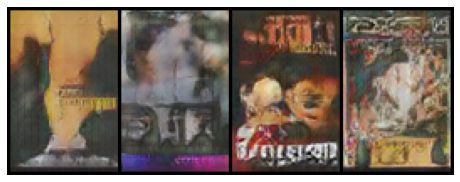

KID score:



  0%|          | 0/5 [00:00<?, ?it/s]D:\ProgramData\Anaconda3\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
100%|██████████| 5/5 [01:06<00:00, 13.30s/it]

Mode: generated | Mean: 0.35590964555740356 | Std: 1.5394257957268564e-07


In [6]:
generator, _ = dcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                            num_img_channels=NUM_IMG_CHANNELS,
                                            num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                            base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                            device=device)
demonstrate_model("DCGAN", generator, compute_kid=True, conditional=False)

In [7]:
generator, _ = wdcgan_gp.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                             num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                             base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                             base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                             d_norm_layer_type=D_NORM_LAYER_TYPE, padding_mode=PADDING_MODE,
                                             device=device)
#demonstrate_model("WDCGAN", generator, compute_kid=True, conditional=False)

In [8]:
generator, _ = sndcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                              num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                              base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                              base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                              device=device)
#demonstrate_model("SNDCGAN", generator, compute_kid=True, conditional=False)

In [9]:
generator, discriminator = rdcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                            num_img_channels=NUM_IMG_CHANNELS,
                                            num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_non_conditional,
                                            base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                            device=device)
#demonstrate_model("RaDCGAN", generator, compute_kid=True, conditional=False)

cDCGAN
Full conditional grid:



D:\ProgramData\Anaconda3\lib\site-packages\torch\nn\init.py:46: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is C:\Users\user\AppData\Local\Temp/torch/kernels. This warning will appear only once per process. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cuda\jit_utils.cpp:860.)
  tensor.erfinv_()


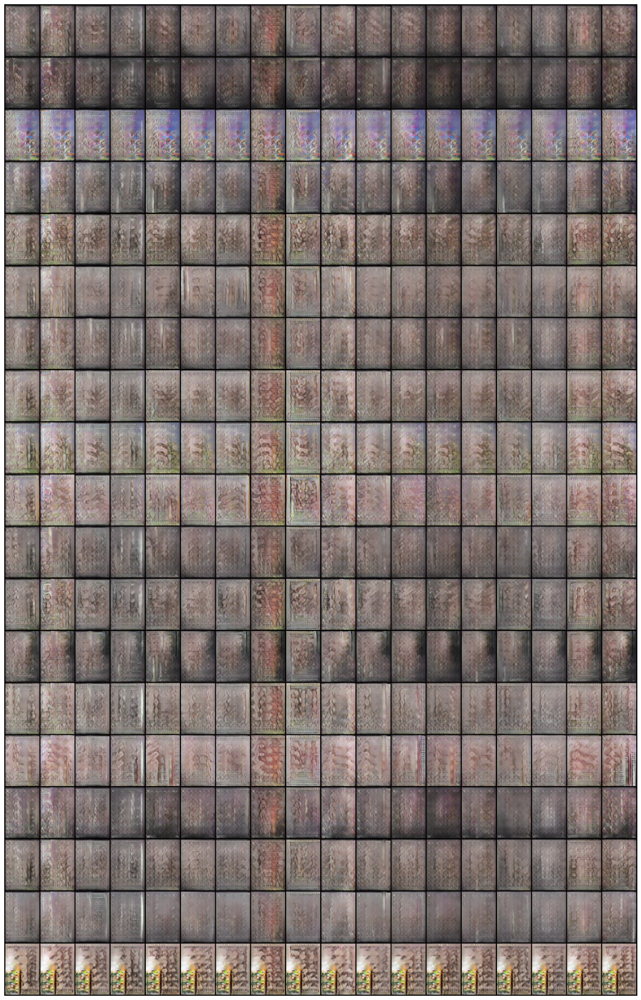

Limited conditional grid:



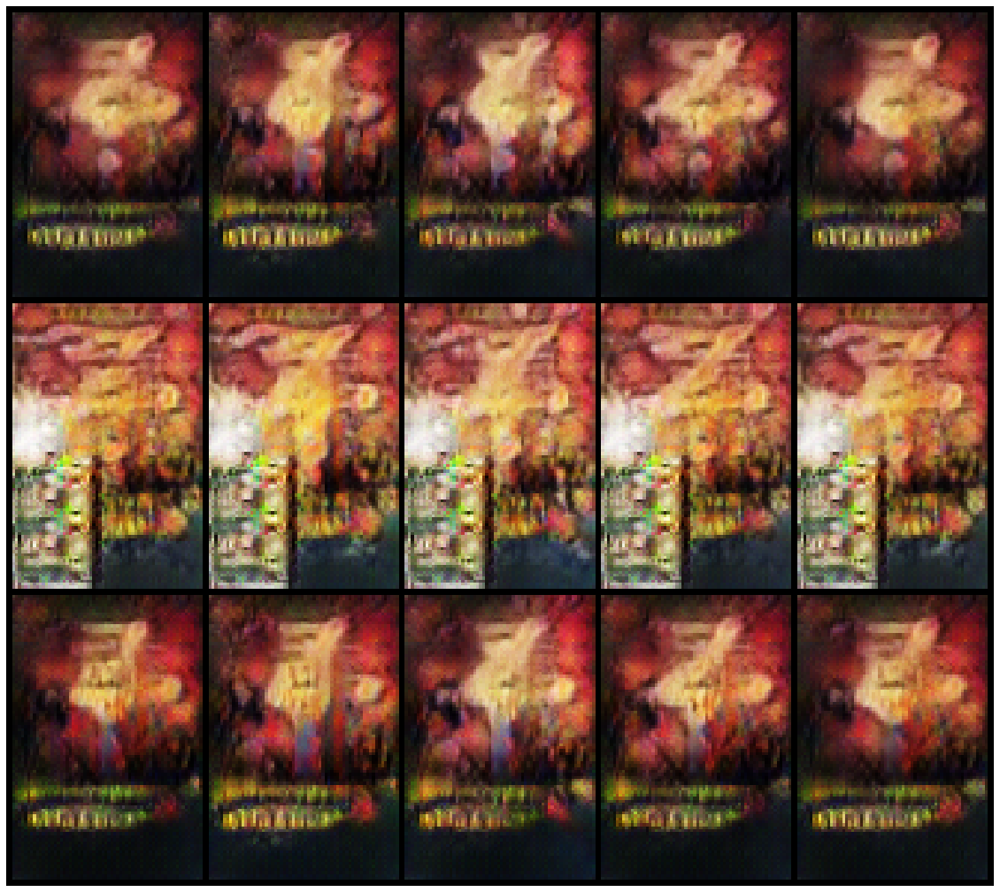

KID score:



100%|██████████| 5/5 [01:06<00:00, 13.23s/it]

Mode: generated | Mean: 0.38473260402679443 | Std: 1.8022197423306352e-07


In [10]:
generator, _ = cdcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                             num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                             base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                             base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                             num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS, device=device)
demonstrate_model("cDCGAN", generator, compute_kid=True, conditional=True)

WcDCGAN
Full conditional grid:



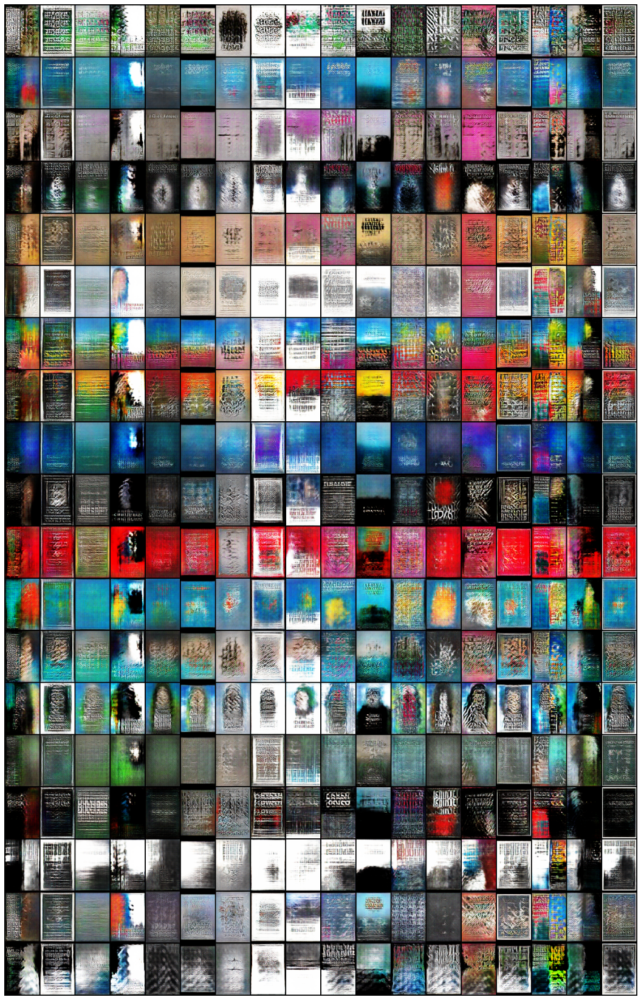

Limited conditional grid:



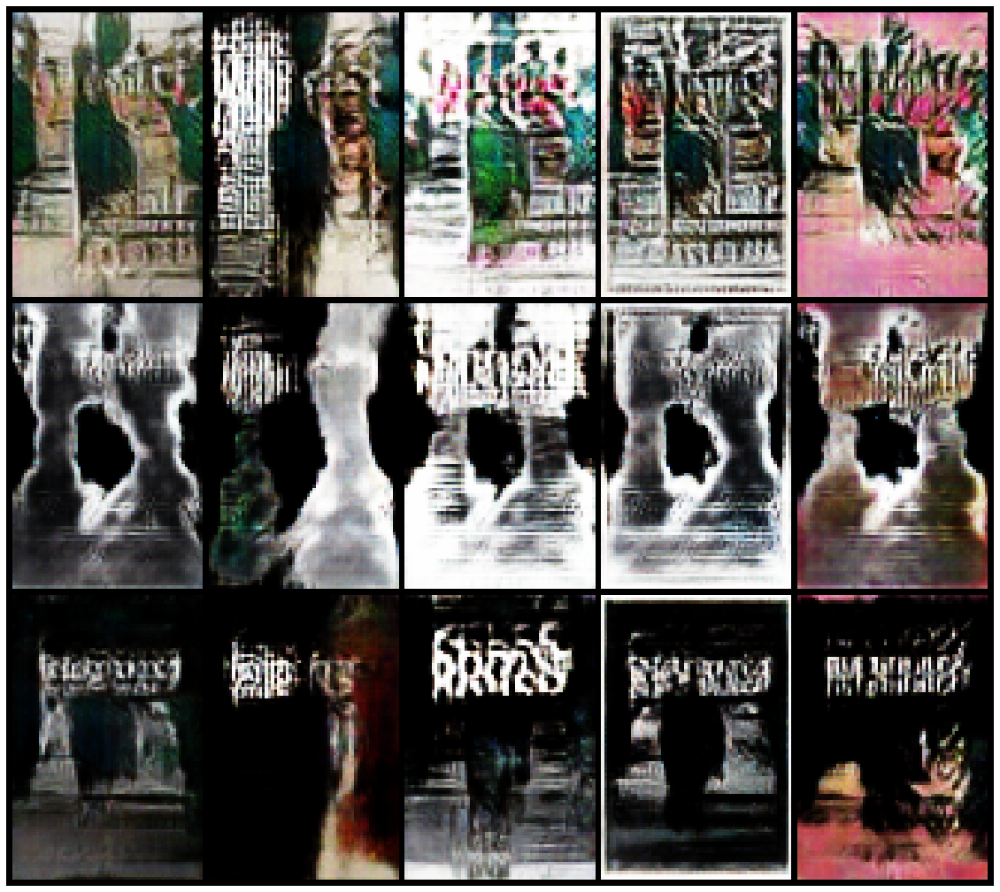

KID score:



100%|██████████| 5/5 [01:05<00:00, 13.16s/it]

Mode: generated | Mean: 0.29044586420059204 | Std: 1.6919889844757563e-07


In [11]:
generator, _ = wcdcgan_gp.create_gan(num_img_channels=NUM_IMG_CHANNELS, num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                    base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                    base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D, padding_mode=PADDING_MODE,
                                    num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS,
                                    d_norm_layer_type=D_NORM_LAYER_TYPE, device=device)
demonstrate_model("WcDCGAN", generator, compute_kid=True, conditional=True)

SNcDCGAN
Full conditional grid:



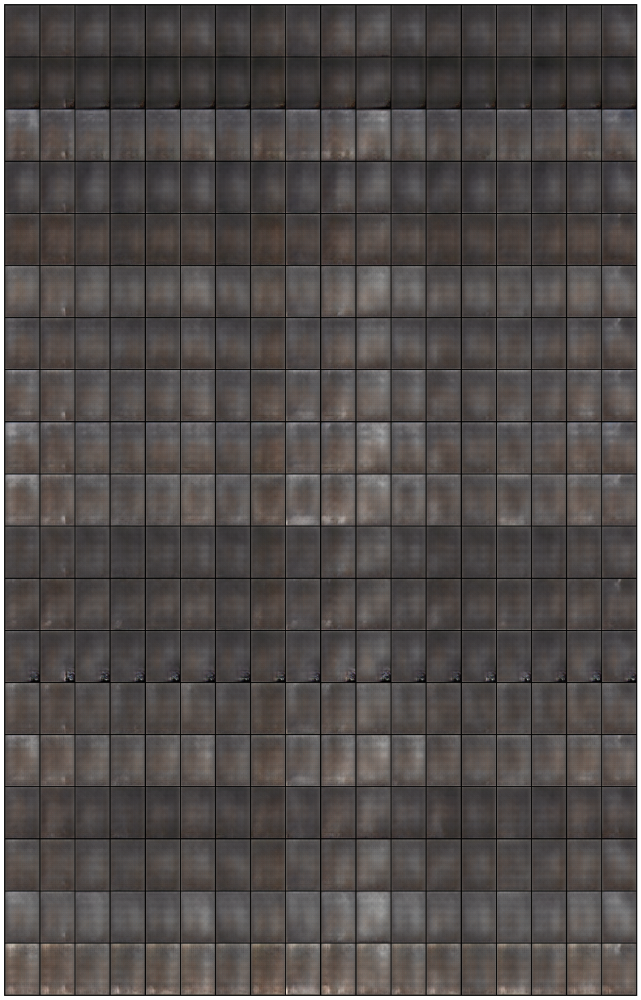

Limited conditional grid:



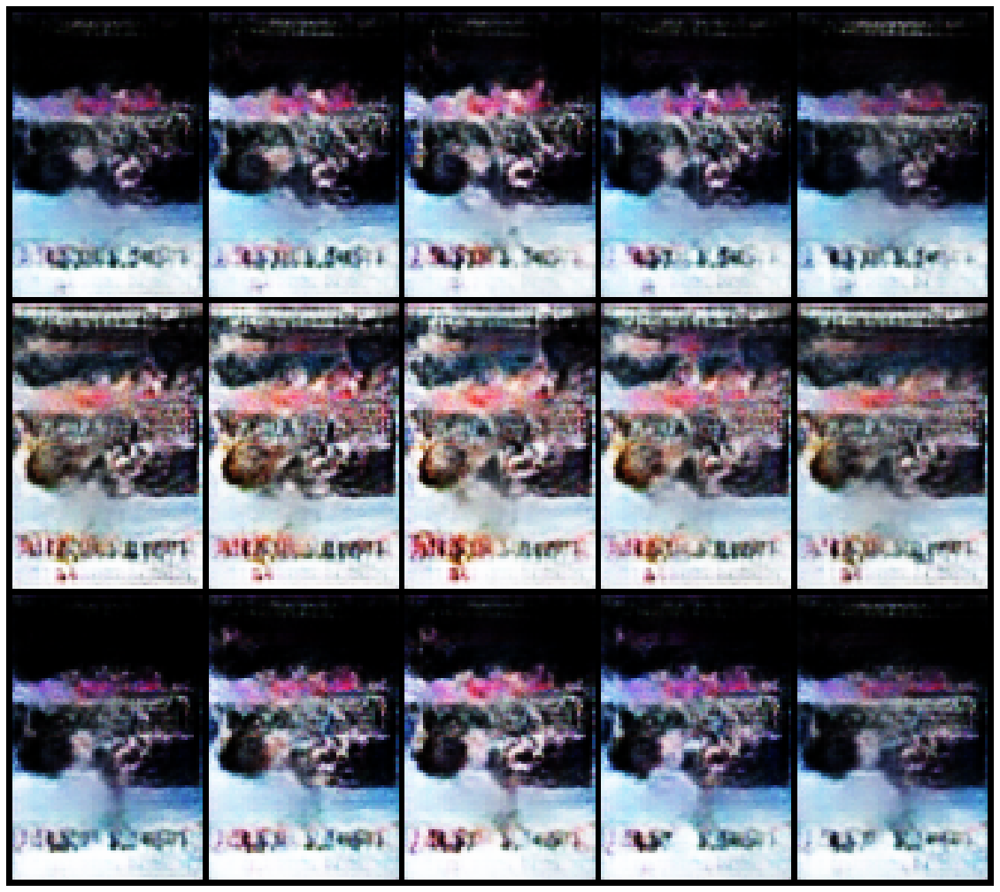

KID score:



100%|██████████| 5/5 [01:07<00:00, 13.54s/it]

Mode: generated | Mean: 0.3471248149871826 | Std: 2.176193305558627e-07


In [12]:
generator, _ = sncdcgan.create_gan(num_img_channels=NUM_IMG_CHANNELS,
                                               num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                               base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                               base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                               padding_mode=PADDING_MODE,
                                               num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS, device=device)
demonstrate_model("SNcDCGAN", generator, compute_kid=True, conditional=True)

In [13]:
generator, _ = rcdcgan.create_gan(img_size=IMAGE_SIZE, img_ratio=IMAGE_SIZE_RATIO,
                                              num_img_channels=NUM_IMG_CHANNELS,
                                              num_noise_vec_channels=NUM_NOISE_VEC_CHANNELS,
                                            num_feature_vec_channels=NUM_FEATURE_VEC_CHANNELS,
                                              base_num_out_channels_g=BASE_NUM_OUT_CHANNELS_G_conditional,
                                              base_num_out_channels_d=BASE_NUM_OUT_CHANNELS_D,
                                              padding_mode=PADDING_MODE,
                                              device=device)
#demonstrate_model("RacDCGAN", generator, compute_kid=True, conditional=True)